In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [2]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [3]:
import os
import pathlib

In [4]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

In [5]:
def load_model(model_dir):
    model = tf.saved_model.load(model_dir)
    return model

In [6]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = '/home/tensorflow/models/research/object_detection/user_folder/data/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
print(category_index)

{1: {'id': 1, 'name': 'gate'}, 2: {'id': 2, 'name': 'red_flare'}, 3: {'id': 3, 'name': 'yellow_flare'}, 4: {'id': 4, 'name': 'mat'}, 5: {'id': 5, 'name': 'red_bowl'}, 6: {'id': 6, 'name': 'blue_bowl'}}


In [7]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/home/tensorflow/models/research/object_detection/user_folder/test_images/')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

In [9]:
model_dir = '/home/tensorflow/models/research/object_detection/user_folder/inference_graph/saved_model/'
detection_model = load_model(model_dir)

In [26]:
def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)
    


    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict.pop('raw_detection_boxes', None)
    output_dict.pop('raw_detection_scores', None)
    output_dict.pop('detection_anchor_indices', None)
    output_dict.pop('detection_multiclass_scores', None)
    
    print(num_detections)
    output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections

    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
    print(output_dict)
    
    return output_dict

In [21]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

In [22]:
from datetime import datetime

{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 1., 1., 4., 1., 1., 3., 1., 2., 1., 1., 2., 1., 1., 1., 3.,
        5., 3., 4., 1., 1., 1., 3., 2., 4., 3., 2., 2., 2., 5., 1., 1.,
        1., 1., 3., 1., 3., 1., 1., 1., 2., 1., 1., 1., 1., 4., 5., 5.,
        3., 4., 1., 3., 2., 3., 3., 3., 3., 2., 1., 4., 1., 4., 1., 2.,
        2., 1., 3., 1., 1., 2., 1., 3., 1., 2., 1., 1., 2., 3., 1., 3.,
        4., 3., 3., 2., 4., 1., 1., 1., 3., 1., 1., 1., 1., 4., 1., 1.,
        2., 1., 1., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[5.08019388e-01, 1.77843541e-01, 9.95638669e-01, 1.00000000e+00],
        [5.43148875e-01, 4.56953317e-01, 9.85790968e-01, 9.85113859e-01],
        [2.26530731e-02, 8.53711367e-02, 1.00000000e+00, 1.00000000e+00],
        [5.43059587e-01, 1.49966717e-01, 9.88935947e-01, 1.000000

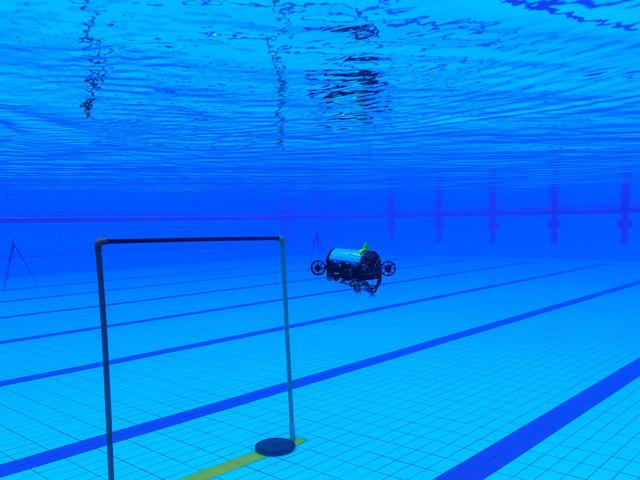

0:00:00.151392
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 4., 1., 5., 4., 4., 5., 4., 1., 2., 1., 1., 4., 2., 1., 1.,
        2., 1., 1., 4., 4., 1., 2., 3., 4., 4., 1., 4., 4., 2., 2., 1.,
        5., 2., 2., 4., 5., 5., 2., 4., 4., 1., 5., 4., 4., 4., 4., 1.,
        1., 1., 1., 4., 2., 1., 5., 2., 1., 4., 1., 1., 4., 5., 3., 4.,
        1., 1., 4., 4., 1., 5., 5., 5., 1., 1., 2., 1., 1., 3., 4., 4.,
        4., 5., 3., 2., 4., 2., 1., 4., 2., 4., 1., 4., 5., 5., 4., 5.,
        1., 3., 1., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[4.74988461e-01, 2.89634466e-01, 6.14106417e-01, 5.10505378e-01],
        [4.21128631e-01, 0.00000000e+00, 9.90844131e-01, 1.00000000e+00],
        [1.36706263e-01, 6.87664747e-03, 9.98376489e-01, 9.95246828e-01],
        [4.18612182e-01, 7.57864058e-01, 4.9889081

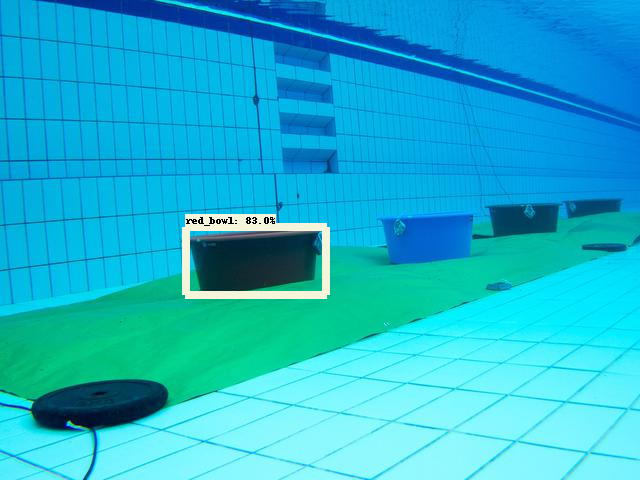

0:00:00.134842
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 5., 1., 1., 2., 1., 4., 1., 1., 1., 4., 1., 3., 1., 1., 1.,
        5., 2., 1., 1., 3., 4., 1., 1., 1., 1., 2., 2., 1., 1., 1., 3.,
        3., 4., 1., 2., 3., 3., 1., 1., 1., 1., 2., 1., 1., 3., 4., 3.,
        4., 1., 1., 3., 2., 1., 2., 1., 5., 1., 1., 1., 1., 3., 5., 2.,
        4., 2., 4., 5., 1., 2., 2., 1., 3., 5., 1., 1., 1., 1., 3., 2.,
        2., 1., 1., 1., 1., 5., 2., 3., 4., 1., 4., 3., 1., 1., 2., 4.,
        4., 4., 2., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[4.93586063e-04, 0.00000000e+00, 1.00000000e+00, 1.00000000e+00],
        [6.96415663e-01, 3.82454880e-02, 8.11287761e-01, 1.31714344e-01],
        [3.59370619e-01, 1.30947828e-02, 9.71213579e-01, 3.06284636e-01],
        [6.19549274e-01, 0.00000000e+00, 9.7223544

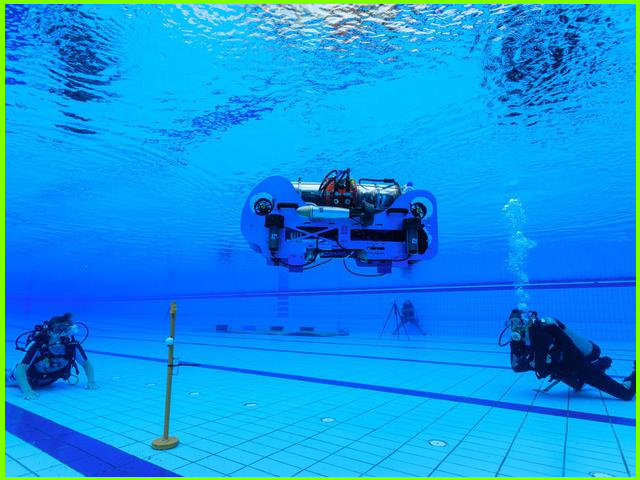

0:00:00.140014
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 5., 4., 5., 1., 4., 1., 1., 1., 4., 1., 5., 1., 2., 1., 2.,
        2., 4., 2., 4., 2., 2., 2., 1., 1., 5., 1., 1., 5., 4., 4., 1.,
        4., 1., 1., 1., 3., 3., 4., 4., 4., 4., 4., 3., 5., 1., 5., 3.,
        5., 3., 3., 2., 4., 1., 5., 2., 1., 3., 1., 1., 5., 5., 3., 2.,
        1., 2., 3., 1., 3., 1., 1., 4., 1., 1., 1., 3., 2., 3., 5., 4.,
        1., 1., 1., 4., 2., 1., 5., 1., 4., 4., 2., 1., 2., 1., 4., 4.,
        2., 2., 3., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[6.8383431e-01, 2.6777226e-01, 8.8329720e-01, 4.8360908e-01],
        [9.0550441e-01, 6.0354453e-01, 1.0000000e+00, 9.7856015e-01],
        [5.4548275e-01, 0.0000000e+00, 9.9361777e-01, 9.6588969e-01],
        [5.6084114e-01, 8.8435568e-02, 6.4449435e-01, 1.775675

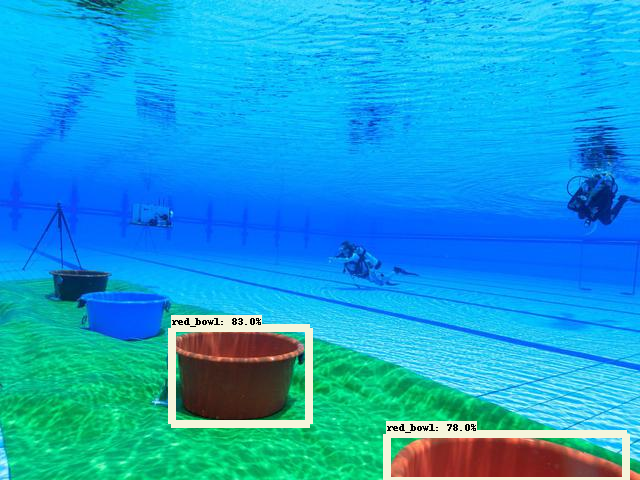

0:00:00.142263
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 4., 5., 5., 4., 5., 4., 1., 4., 4., 1., 4., 1., 1., 1., 4.,
        3., 3., 2., 2., 4., 1., 3., 3., 5., 3., 2., 2., 4., 4., 1., 4.,
        5., 4., 1., 3., 4., 2., 5., 3., 4., 4., 1., 4., 1., 4., 3., 4.,
        5., 1., 4., 4., 2., 5., 5., 4., 1., 3., 2., 2., 3., 1., 1., 4.,
        3., 1., 1., 4., 1., 1., 5., 4., 5., 5., 1., 1., 1., 4., 4., 4.,
        3., 2., 1., 5., 1., 1., 3., 1., 5., 1., 4., 4., 2., 2., 5., 4.,
        5., 5., 4., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.47803774, 0.36856392, 0.64823747, 0.5678345 ],
        [0.43042293, 0.00406653, 0.9970672 , 0.9865437 ],
        [0.45017588, 0.5724465 , 0.56809354, 0.7025514 ],
        [0.4226611 , 0.73911846, 0.5193269 , 0.85411537],
        [0.9629308 , 0.50291574, 0.99517

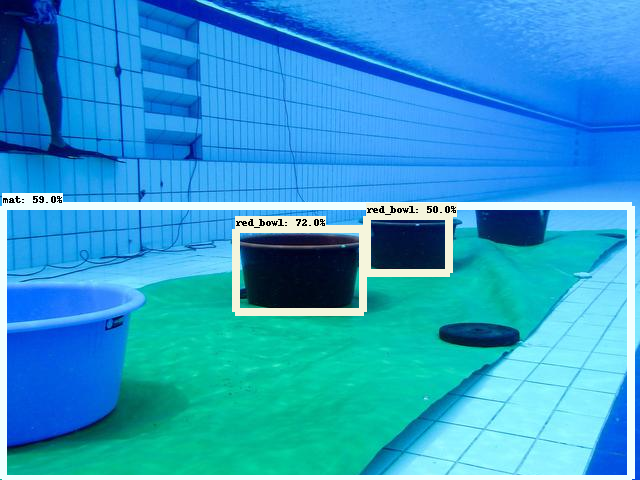

0:00:00.141968
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[4., 1., 4., 4., 4., 4., 4., 4., 1., 1., 4., 4., 4., 4., 1., 4.,
        5., 5., 4., 3., 5., 2., 1., 1., 1., 1., 4., 2., 4., 4., 4., 4.,
        4., 1., 1., 4., 2., 1., 1., 5., 4., 4., 4., 4., 4., 4., 4., 4.,
        4., 1., 2., 4., 3., 1., 1., 2., 4., 4., 4., 1., 4., 5., 3., 3.,
        1., 5., 5., 5., 2., 2., 2., 2., 4., 5., 4., 1., 4., 1., 1., 2.,
        4., 3., 1., 4., 4., 2., 4., 1., 1., 2., 1., 1., 4., 4., 1., 2.,
        2., 4., 5., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[8.00146401e-01, 0.00000000e+00, 9.90673959e-01, 9.73397851e-01],
        [0.00000000e+00, 2.90681720e-02, 3.62799913e-01, 1.00000000e+00],
        [7.05327153e-01, 4.29557264e-03, 8.44896197e-01, 2.92488933e-01],
        [8.89235854e-01, 0.00000000e+00, 9.9684929

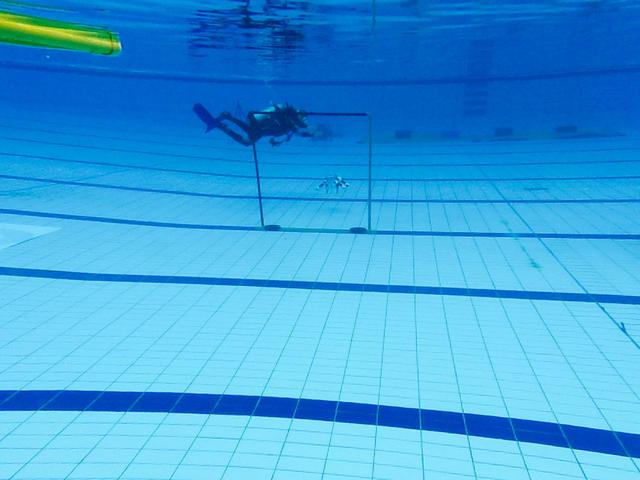

0:00:00.134592
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 1., 3., 1., 1., 2., 1., 3., 4., 3., 1., 3., 3., 1., 3., 3.,
        1., 2., 3., 1., 1., 1., 3., 1., 1., 2., 2., 1., 2., 2., 4., 3.,
        1., 1., 4., 1., 1., 1., 1., 3., 1., 2., 4., 1., 1., 1., 3., 2.,
        4., 2., 4., 1., 1., 4., 2., 3., 1., 1., 1., 1., 1., 1., 3., 1.,
        1., 2., 1., 1., 3., 1., 2., 3., 4., 1., 4., 3., 5., 1., 1., 1.,
        1., 1., 1., 4., 2., 1., 3., 1., 2., 4., 1., 2., 1., 3., 1., 4.,
        1., 1., 2., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[3.6155283e-03, 1.0196060e-02, 9.9838483e-01, 1.0000000e+00],
        [2.0790607e-02, 1.2311190e-03, 9.4287515e-01, 3.5923117e-01],
        [0.0000000e+00, 9.6070841e-03, 9.3049014e-01, 1.1090679e-01],
        [1.5075266e-02, 5.5808032e-01, 9.6391308e-01, 9.799519

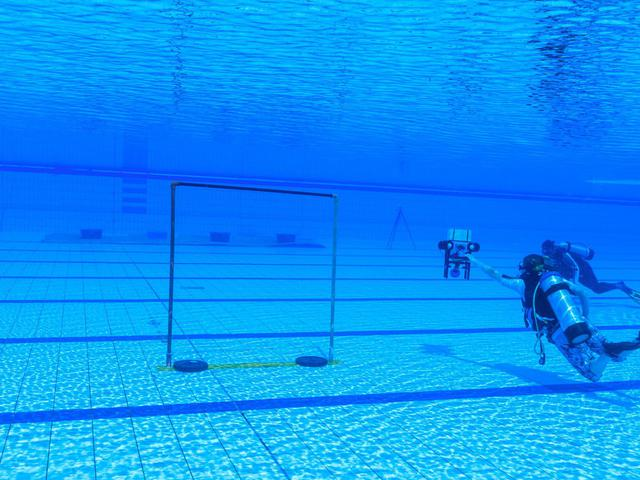

0:00:00.131176
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 1., 4., 5., 1., 4., 2., 5., 4., 1., 1., 1., 1., 1., 4., 2.,
        3., 1., 2., 1., 1., 1., 4., 1., 1., 1., 4., 5., 1., 3., 1., 1.,
        4., 1., 3., 4., 2., 4., 1., 2., 2., 1., 1., 1., 1., 2., 2., 1.,
        1., 1., 2., 1., 4., 1., 5., 1., 1., 2., 3., 2., 3., 2., 1., 1.,
        1., 3., 2., 3., 2., 2., 1., 5., 1., 2., 1., 3., 1., 4., 1., 4.,
        1., 1., 5., 2., 2., 1., 3., 4., 4., 2., 1., 1., 2., 4., 2., 3.,
        1., 1., 2., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.59771454, 0.3615485 , 0.7143009 , 0.5049617 ],
        [0.00343642, 0.        , 1.        , 1.        ],
        [0.5799293 , 0.05328527, 0.80457705, 0.99628854],
        [0.5704046 , 0.9408127 , 0.6688487 , 1.        ],
        [0.18856722, 0.01031429, 0.96028

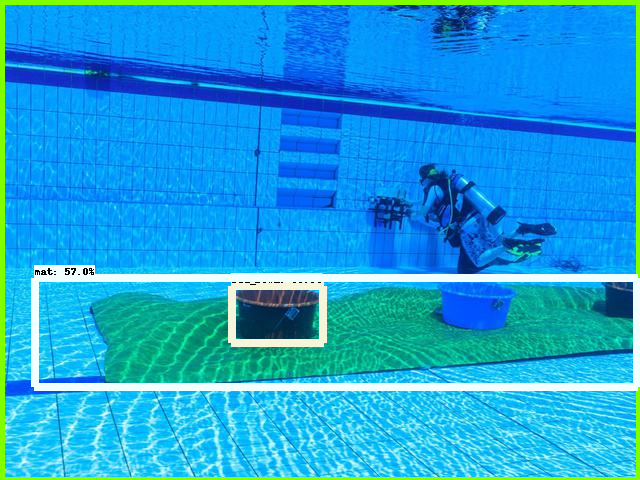

0:00:00.134157
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[4., 5., 5., 4., 5., 4., 5., 4., 4., 4., 5., 4., 4., 4., 4., 4.,
        4., 4., 4., 5., 4., 4., 5., 4., 4., 5., 4., 4., 1., 5., 5., 1.,
        4., 4., 5., 5., 2., 4., 4., 5., 4., 4., 1., 1., 1., 5., 4., 4.,
        3., 5., 4., 1., 5., 4., 2., 4., 1., 4., 2., 4., 5., 4., 4., 1.,
        1., 1., 1., 3., 1., 4., 4., 5., 1., 5., 1., 1., 1., 1., 3., 5.,
        4., 1., 4., 5., 1., 5., 5., 5., 1., 2., 1., 5., 4., 4., 3., 1.,
        5., 3., 2., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.37756366, 0.        , 0.6749608 , 1.        ],
        [0.42404127, 0.7124786 , 0.53546894, 0.80387336],
        [0.4374427 , 0.17033175, 0.57117856, 0.26376387],
        [0.9268231 , 0.        , 0.99617535, 0.3017674 ],
        [0.40937698, 0.8668747 , 0.51928

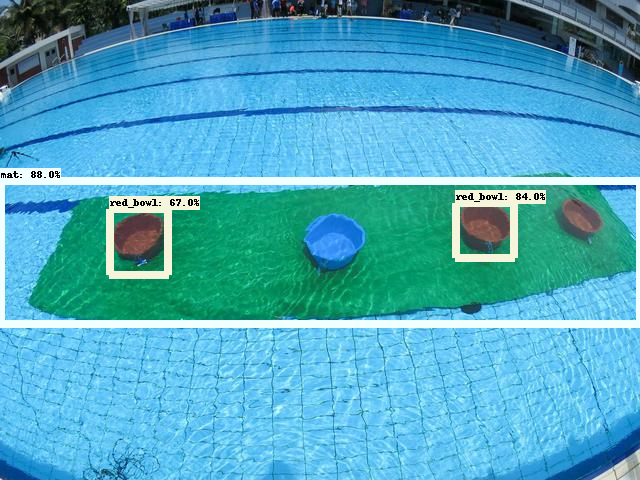

0:00:00.141424
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 4., 5., 5., 5., 4., 5., 4., 4., 4., 4., 4., 4., 4., 5., 4.,
        2., 1., 2., 2., 2., 4., 4., 2., 2., 2., 1., 2., 2., 4., 1., 2.,
        4., 4., 2., 5., 2., 2., 4., 5., 5., 1., 4., 2., 4., 2., 4., 2.,
        4., 2., 5., 2., 1., 4., 3., 4., 1., 5., 2., 5., 3., 2., 2., 4.,
        1., 1., 4., 1., 2., 2., 1., 1., 2., 5., 2., 1., 1., 1., 5., 5.,
        2., 4., 3., 1., 1., 5., 1., 2., 2., 2., 3., 2., 5., 2., 4., 3.,
        2., 1., 2., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[7.95045674e-01, 5.63031018e-01, 8.69358480e-01, 6.35958493e-01],
        [7.24190354e-01, 4.56930786e-01, 9.27027464e-01, 1.00000000e+00],
        [7.42845297e-01, 8.70508969e-01, 8.06697011e-01, 9.31109250e-01],
        [7.27397859e-01, 9.51356173e-01, 7.9022961

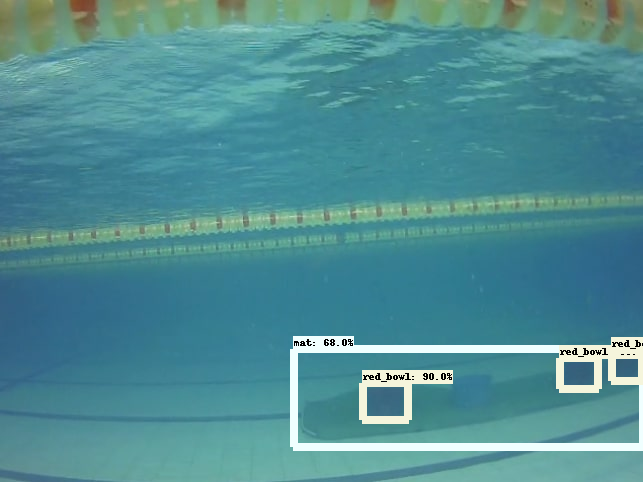

0:00:00.137257
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 4., 4., 4., 4., 5., 4., 4., 4., 5., 4., 4., 5., 5., 5., 5.,
        4., 5., 4., 4., 1., 4., 1., 4., 4., 5., 5., 5., 5., 5., 4., 5.,
        2., 4., 4., 4., 4., 1., 4., 4., 4., 4., 1., 4., 1., 1., 1., 1.,
        4., 2., 4., 2., 5., 5., 2., 1., 5., 4., 1., 3., 1., 4., 4., 2.,
        2., 1., 5., 1., 5., 2., 2., 5., 1., 1., 4., 2., 1., 5., 3., 1.,
        4., 5., 1., 2., 1., 1., 3., 2., 1., 5., 2., 1., 2., 5., 1., 1.,
        2., 3., 4., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.8013046 , 0.606925  , 0.9310435 , 0.7275404 ],
        [0.781544  , 0.41810343, 1.        , 0.9986553 ],
        [0.7978884 , 0.        , 0.9863037 , 0.18190478],
        [0.7283805 , 0.0074586 , 1.        , 0.10806569],
        [0.851857  , 0.        , 1.     

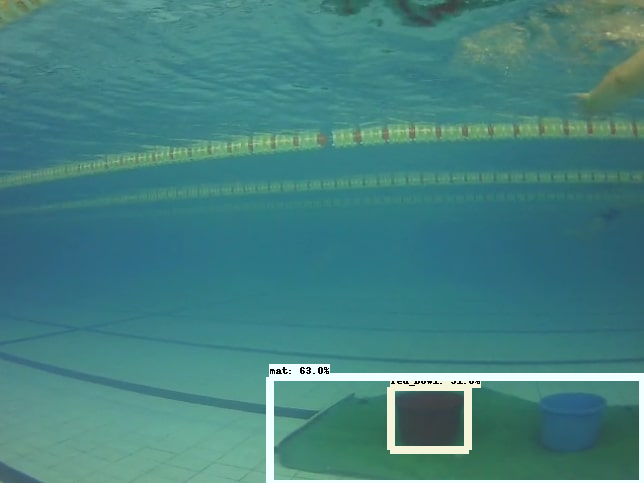

0:00:00.138197
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 4., 5., 5., 5., 5., 5., 4., 4., 5., 4., 2., 4., 3., 5., 4.,
        5., 4., 1., 4., 4., 4., 5., 1., 4., 1., 4., 3., 1., 4., 5., 1.,
        5., 5., 4., 5., 5., 5., 1., 5., 2., 4., 4., 2., 2., 4., 1., 4.,
        4., 5., 5., 4., 2., 5., 4., 4., 2., 4., 4., 4., 5., 4., 5., 4.,
        3., 3., 5., 5., 4., 4., 1., 5., 1., 3., 4., 5., 1., 4., 1., 2.,
        1., 5., 5., 1., 4., 2., 2., 4., 5., 2., 2., 3., 1., 2., 4., 4.,
        5., 2., 4., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.73503894, 0.43399185, 0.8238959 , 0.5316845 ],
        [0.72219867, 0.16353944, 0.9996814 , 0.7066641 ],
        [0.9710721 , 0.36488676, 0.9966172 , 0.5269892 ],
        [0.75934976, 0.43269306, 0.86109275, 0.53673005],
        [0.8027038 , 0.42771745, 0.92368

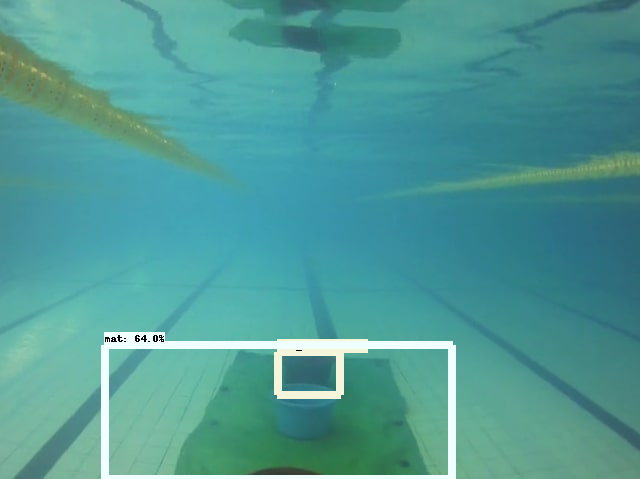

0:00:00.114777
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 1., 4., 4., 4., 4., 4., 1., 2., 4., 5., 2., 4., 4., 4., 4.,
        1., 4., 5., 4., 4., 4., 4., 4., 3., 3., 4., 1., 4., 5., 1., 1.,
        1., 5., 4., 1., 4., 4., 5., 4., 5., 1., 1., 4., 1., 1., 1., 4.,
        4., 4., 4., 4., 4., 4., 1., 1., 1., 1., 4., 5., 4., 4., 4., 1.,
        4., 1., 4., 4., 2., 4., 1., 1., 2., 4., 1., 4., 1., 1., 1., 5.,
        1., 1., 1., 1., 2., 2., 3., 3., 1., 5., 1., 1., 1., 5., 1., 1.,
        4., 1., 1., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[7.3632890e-01, 7.7930647e-01, 7.9999369e-01, 8.5255033e-01],
        [5.4970610e-01, 8.4606159e-01, 1.0000000e+00, 9.9893641e-01],
        [7.2330940e-01, 6.8218118e-01, 8.5063410e-01, 1.0000000e+00],
        [7.4494439e-01, 6.8041891e-01, 8.8816446e-01, 9.784538

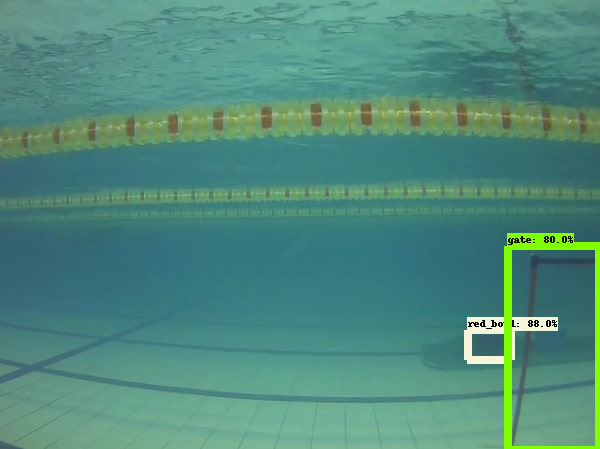

0:00:00.109984
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 5., 4., 5., 4., 5., 5., 4., 3., 5., 4., 1., 1., 2., 4., 1.,
        1., 4., 5., 4., 1., 4., 1., 2., 5., 4., 4., 4., 1., 5., 1., 1.,
        4., 4., 4., 1., 4., 1., 3., 1., 3., 4., 5., 1., 4., 1., 5., 4.,
        1., 5., 4., 1., 4., 4., 4., 1., 1., 4., 1., 1., 1., 1., 2., 1.,
        1., 1., 1., 1., 2., 1., 4., 4., 2., 4., 1., 2., 5., 4., 2., 1.,
        4., 2., 2., 4., 2., 3., 5., 4., 1., 4., 1., 2., 1., 5., 3., 4.,
        4., 1., 5., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[5.4537529e-01, 6.6417420e-01, 9.9163562e-01, 9.8202825e-01],
        [7.3471999e-01, 5.9189653e-01, 7.9436374e-01, 6.6013503e-01],
        [6.5867227e-01, 5.5164415e-01, 8.7381560e-01, 9.8610812e-01],
        [6.9047683e-01, 8.5069233e-01, 7.6052719e-01, 9.215663

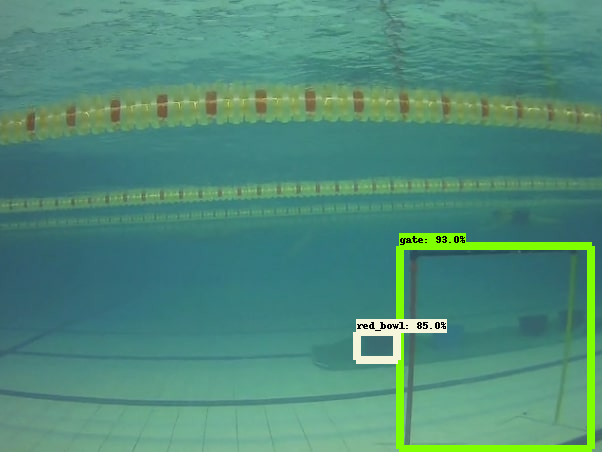

0:00:00.118780
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 5., 4., 1., 5., 5., 5., 4., 2., 5., 2., 1., 2., 1., 4., 1.,
        4., 1., 5., 2., 3., 5., 4., 2., 1., 1., 3., 4., 1., 3., 1., 1.,
        1., 1., 1., 5., 1., 5., 1., 4., 1., 2., 1., 4., 1., 2., 4., 5.,
        2., 2., 2., 1., 2., 4., 5., 1., 1., 2., 4., 3., 1., 1., 1., 2.,
        2., 1., 2., 1., 4., 4., 1., 2., 1., 1., 4., 4., 1., 1., 4., 2.,
        1., 1., 1., 1., 1., 2., 1., 1., 4., 1., 2., 4., 4., 2., 5., 2.,
        1., 4., 2., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[6.96373641e-01, 2.12799236e-01, 7.56927311e-01, 2.80744195e-01],
        [7.04436123e-01, 5.13759017e-01, 7.59250820e-01, 5.79146028e-01],
        [6.88244164e-01, 8.62261355e-02, 7.98638284e-01, 7.63566256e-01],
        [4.66206044e-01, 7.65562057e-04, 9.8546898

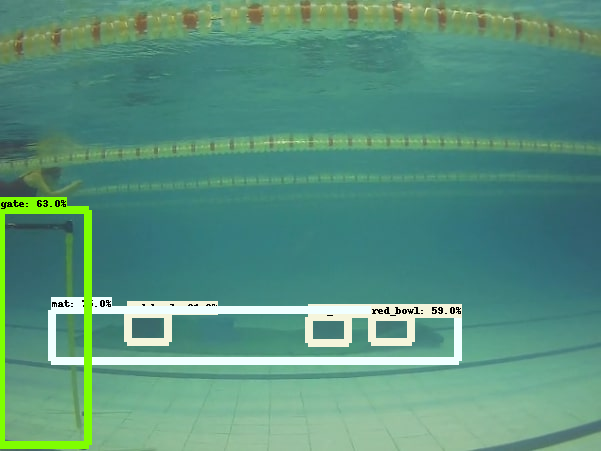

0:00:00.110703
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 1., 2., 1., 1., 2., 1., 1., 3., 4., 4., 1., 1., 1., 4.,
        4., 4., 2., 2., 5., 5., 1., 1., 3., 5., 4., 1., 4., 1., 1., 4.,
        4., 2., 3., 4., 1., 4., 1., 2., 2., 5., 1., 1., 4., 5., 3., 3.,
        4., 4., 2., 5., 1., 4., 1., 4., 4., 4., 4., 2., 1., 4., 2., 3.,
        1., 2., 5., 4., 2., 1., 4., 5., 3., 5., 4., 2., 1., 3., 1., 1.,
        1., 5., 2., 4., 1., 3., 4., 4., 4., 2., 4., 3., 2., 3., 2., 1.,
        4., 5., 4., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.12320194, 0.30955738, 0.7915629 , 0.4671662 ],
        [0.11765322, 0.29227546, 0.88250947, 0.6914377 ],
        [0.05098921, 0.5630057 , 0.9754421 , 0.78068185],
        [0.15893938, 0.31803736, 0.6387958 , 0.44957444],
        [0.17001534, 0.32631811, 0.72959

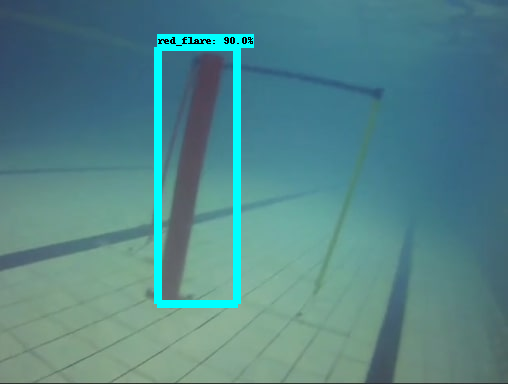

0:00:00.093753
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 3., 5., 2., 3., 1., 1., 4., 4., 4., 1., 1., 1., 4., 5.,
        5., 4., 5., 1., 1., 1., 2., 1., 5., 5., 4., 5., 1., 4., 4., 4.,
        4., 4., 1., 4., 4., 1., 1., 4., 1., 2., 2., 4., 1., 1., 1., 1.,
        1., 2., 2., 2., 4., 1., 4., 1., 2., 1., 1., 1., 1., 2., 5., 2.,
        3., 1., 4., 4., 2., 4., 3., 5., 4., 2., 1., 5., 5., 3., 1., 4.,
        2., 1., 1., 5., 2., 2., 1., 4., 3., 3., 3., 1., 2., 1., 4., 2.,
        1., 1., 1., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.54164   , 0.15941936, 0.9436998 , 0.31598097],
        [0.52893496, 0.23721361, 0.97638714, 0.31604093],
        [0.54164   , 0.15941936, 0.9436998 , 0.31598097],
        [0.54164   , 0.15941936, 0.9436998 , 0.31598097],
        [0.52934116, 0.18550034, 0.97646

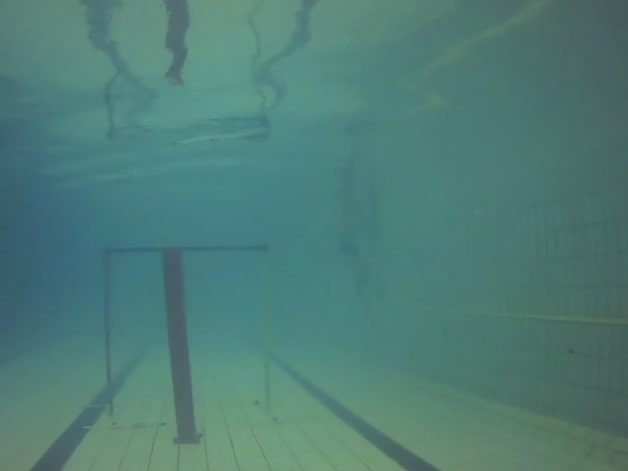

0:00:00.111412
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 1., 1., 1., 2., 2., 3., 2., 1., 4., 2., 2., 1., 4., 2.,
        1., 2., 4., 1., 1., 1., 1., 4., 4., 2., 2., 1., 1., 4., 3., 1.,
        4., 2., 4., 1., 3., 3., 1., 4., 4., 4., 4., 1., 4., 1., 4., 1.,
        2., 3., 1., 2., 3., 2., 1., 2., 1., 2., 5., 4., 2., 2., 3., 2.,
        2., 2., 2., 3., 4., 4., 1., 1., 4., 2., 4., 3., 4., 2., 2., 1.,
        4., 1., 5., 4., 1., 1., 4., 2., 5., 4., 2., 2., 2., 1., 3., 1.,
        1., 1., 1., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[7.20380247e-02, 2.15598971e-01, 9.88121748e-01, 6.23547673e-01],
        [1.04377270e-02, 3.04325461e-01, 1.00000000e+00, 4.38427508e-01],
        [7.04273582e-02, 1.26333788e-01, 9.61002052e-01, 4.72419500e-01],
        [9.68570113e-02, 4.21559215e-01, 9.8198920

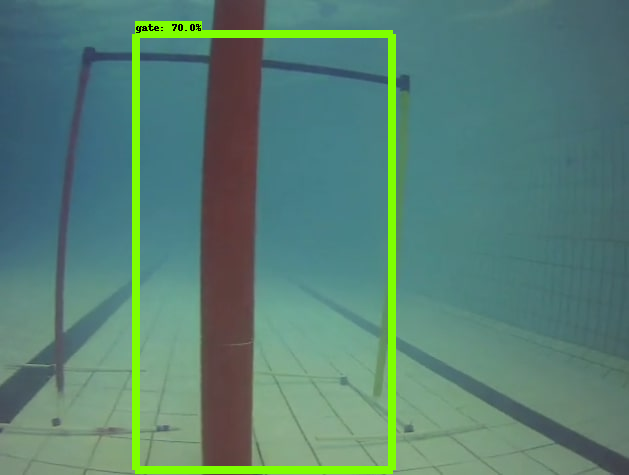

0:00:00.108277
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 3., 1., 4., 5., 1., 2., 4., 2., 1., 4., 3., 1., 4.,
        4., 1., 2., 1., 4., 4., 1., 4., 4., 1., 4., 2., 4., 3., 2., 3.,
        2., 1., 2., 2., 1., 1., 1., 4., 1., 4., 1., 4., 2., 3., 1., 2.,
        1., 2., 1., 2., 2., 1., 4., 1., 2., 4., 1., 1., 1., 3., 1., 4.,
        4., 3., 4., 1., 4., 4., 2., 4., 5., 4., 4., 2., 2., 2., 4., 5.,
        3., 3., 1., 1., 1., 2., 4., 2., 3., 4., 3., 3., 2., 5., 2., 3.,
        1., 3., 4., 3.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.41282576, 0.14363801, 0.99244934, 0.57387465],
        [0.41101748, 0.1831922 , 1.        , 0.46428955],
        [0.42264557, 0.13470705, 0.98368335, 0.57704943],
        [0.40299666, 0.15202399, 1.        , 0.44548094],
        [0.35730258, 0.210883  , 1.     

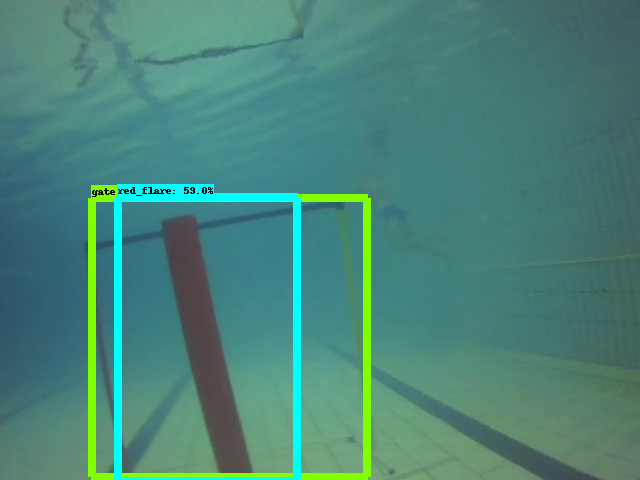

0:00:00.124157
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 1., 1., 1., 1., 3., 2., 2., 2., 4., 1., 1., 1., 4.,
        1., 1., 1., 4., 2., 4., 5., 1., 4., 3., 1., 4., 4., 4., 1., 2.,
        2., 2., 1., 3., 1., 1., 1., 1., 3., 1., 3., 2., 1., 3., 1., 4.,
        1., 3., 2., 2., 4., 2., 5., 1., 4., 4., 1., 4., 2., 4., 3., 2.,
        3., 3., 4., 1., 2., 2., 1., 4., 3., 3., 2., 3., 1., 3., 1., 1.,
        5., 4., 1., 1., 4., 1., 3., 5., 4., 2., 1., 1., 3., 3., 1., 4.,
        5., 1., 4., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.24349663, 0.35873646, 0.9998909 , 0.75748366],
        [0.2710869 , 0.653458  , 1.        , 0.788352  ],
        [0.18717858, 0.5901889 , 1.        , 0.8010023 ],
        [0.2710869 , 0.653458  , 1.        , 0.788352  ],
        [0.18717858, 0.5901889 , 1.     

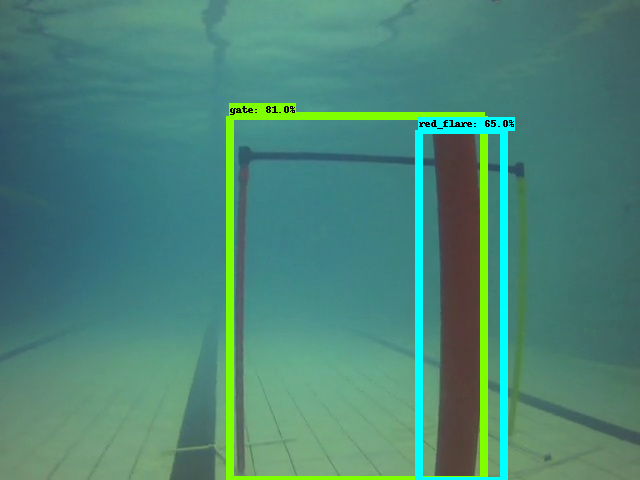

0:00:00.118049
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 2., 1., 3., 2., 4., 2., 1., 3., 1., 1., 4., 1., 1.,
        1., 1., 1., 2., 4., 1., 4., 2., 5., 4., 3., 1., 4., 1., 1., 3.,
        1., 2., 2., 2., 1., 1., 1., 1., 1., 4., 4., 1., 2., 1., 1., 4.,
        1., 1., 1., 5., 3., 1., 4., 1., 1., 1., 2., 4., 4., 2., 1., 1.,
        4., 2., 5., 5., 5., 2., 1., 1., 2., 1., 1., 1., 2., 2., 2., 5.,
        3., 5., 4., 1., 1., 4., 1., 3., 4., 1., 1., 5., 2., 1., 2., 4.,
        1., 2., 3., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.0145635 , 0.3571502 , 0.9955779 , 0.8630179 ],
        [0.01059452, 0.74834913, 0.9901805 , 0.9250688 ],
        [0.00569963, 0.65061414, 1.        , 0.91757715],
        [0.        , 0.7690545 , 0.63398933, 0.93530494],
        [0.01298946, 0.6245785 , 0.99663

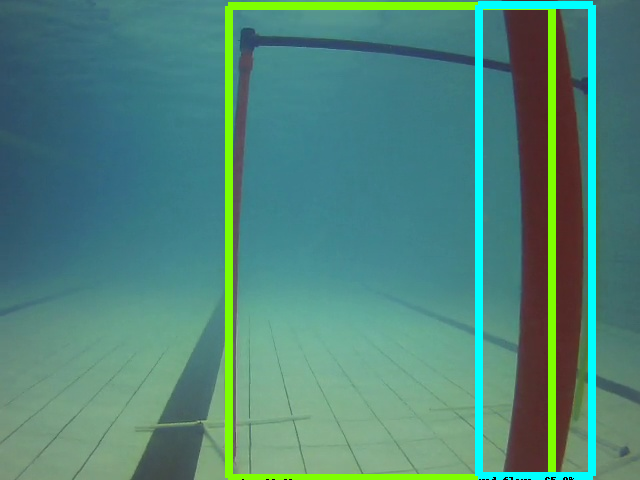

0:00:00.135188
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 4., 5., 4., 3., 1., 4., 4., 4., 2., 4., 3., 4., 4., 1.,
        4., 1., 1., 5., 4., 3., 2., 4., 3., 1., 4., 1., 1., 2., 4., 1.,
        2., 4., 4., 2., 3., 4., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1.,
        3., 4., 4., 1., 3., 3., 4., 4., 2., 2., 2., 4., 4., 2., 1., 1.,
        1., 1., 4., 4., 2., 5., 1., 1., 4., 4., 3., 2., 3., 2., 3., 4.,
        1., 3., 2., 2., 3., 3., 3., 4., 4., 1., 4., 3., 2., 5., 1., 4.,
        5., 4., 4., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[2.1239176e-01, 2.7705079e-01, 8.3682775e-01, 6.1855686e-01],
        [2.2023559e-01, 2.7307454e-01, 8.3855224e-01, 6.2103701e-01],
        [7.6553589e-01, 9.7095710e-01, 9.1691571e-01, 9.9775654e-01],
        [2.1239176e-01, 2.7705079e-01, 8.3682775e-01, 6.185568

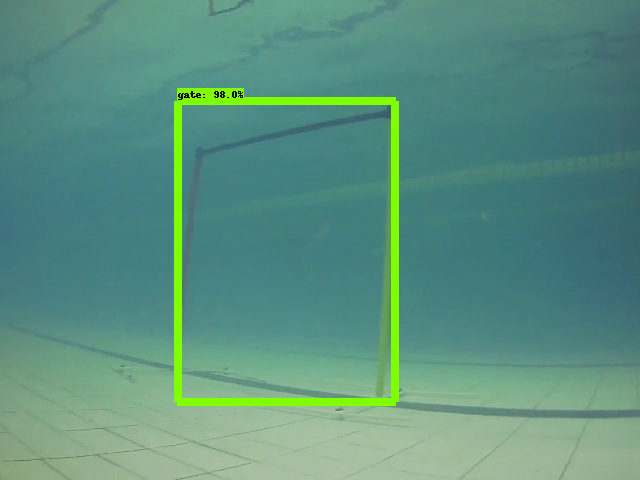

0:00:00.116950
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 4., 1., 4., 5., 4., 4., 4., 4., 4., 5., 4., 1., 1., 4., 1.,
        1., 5., 1., 3., 2., 1., 1., 4., 3., 1., 3., 1., 4., 1., 4., 1.,
        3., 2., 1., 1., 1., 1., 4., 3., 5., 4., 1., 1., 4., 1., 3., 1.,
        1., 5., 5., 1., 2., 1., 1., 2., 1., 1., 5., 4., 4., 2., 3., 5.,
        1., 1., 1., 4., 2., 2., 1., 2., 1., 5., 2., 1., 4., 1., 1., 2.,
        3., 4., 2., 1., 4., 1., 4., 3., 2., 1., 5., 1., 2., 4., 4., 3.,
        1., 2., 1., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.4143065 , 0.10215314, 0.98661506, 0.29382032],
        [0.73451716, 0.43193018, 0.9972808 , 0.8726431 ],
        [0.42033714, 0.10149224, 0.9941552 , 0.51019067],
        [0.81760585, 0.38975987, 0.9966351 , 0.92218935],
        [0.7436632 , 0.57721955, 0.98969

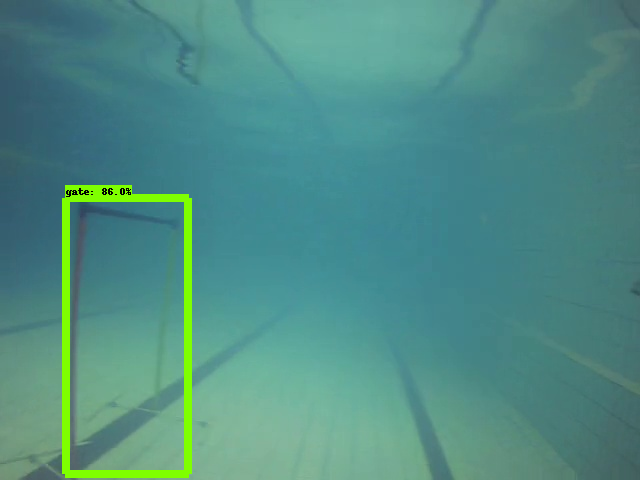

0:00:00.105062
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 2., 3., 1., 5., 1., 3., 1., 1., 5., 1., 4., 4., 1.,
        2., 1., 2., 2., 2., 4., 5., 1., 1., 2., 1., 1., 4., 1., 1., 4.,
        1., 4., 1., 4., 2., 1., 1., 1., 2., 2., 3., 2., 1., 1., 1., 2.,
        4., 4., 1., 2., 3., 1., 4., 3., 1., 3., 5., 4., 1., 5., 4., 2.,
        4., 1., 1., 2., 4., 1., 5., 1., 1., 2., 3., 1., 3., 1., 4., 4.,
        4., 5., 2., 1., 4., 4., 1., 3., 4., 2., 4., 4., 4., 1., 2., 2.,
        2., 4., 4., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[3.74819756e-01, 3.48568916e-01, 7.46903062e-01, 6.42735958e-01],
        [1.08183503e-01, 6.48139417e-01, 9.35000300e-01, 7.51605809e-01],
        [1.16479576e-01, 6.66966259e-01, 6.88440979e-01, 7.39600837e-01],
        [3.94783765e-01, 6.33579135e-01, 9.0740490

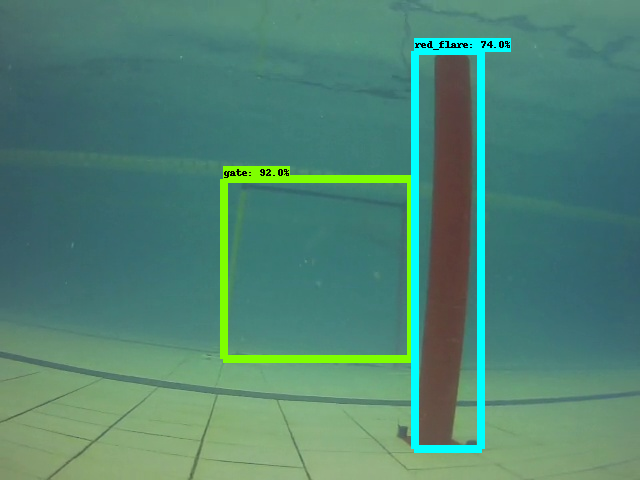

0:00:00.117546
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[3., 1., 3., 3., 1., 2., 2., 2., 1., 2., 2., 3., 4., 2., 3., 2.,
        5., 2., 4., 1., 1., 3., 1., 3., 5., 1., 1., 1., 3., 2., 2., 3.,
        4., 1., 2., 3., 1., 1., 2., 4., 2., 4., 3., 4., 3., 2., 1., 4.,
        5., 3., 1., 2., 3., 5., 1., 2., 2., 4., 1., 1., 2., 2., 1., 5.,
        5., 3., 2., 2., 2., 5., 1., 4., 4., 3., 3., 2., 4., 3., 1., 4.,
        1., 4., 1., 2., 3., 3., 2., 3., 2., 4., 1., 3., 3., 5., 1., 4.,
        1., 4., 1., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.42122173, 0.64642024, 0.74534297, 0.68530095],
        [0.9000895 , 0.        , 0.9975047 , 0.9175337 ],
        [0.5066218 , 0.64619744, 0.69320697, 0.68237674],
        [0.42077434, 0.61112905, 0.7468153 , 0.6700418 ],
        [0.03731686, 0.06151477, 0.96712

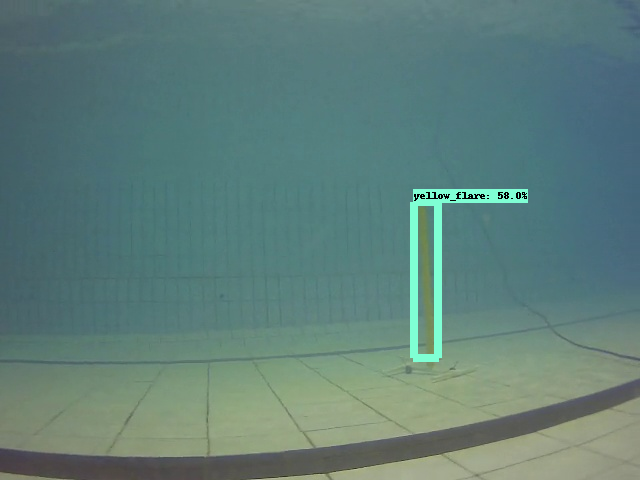

0:00:00.120602
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[3., 3., 4., 4., 4., 4., 4., 2., 2., 1., 2., 1., 3., 1., 5., 1.,
        3., 2., 3., 3., 2., 4., 2., 2., 3., 2., 2., 3., 2., 2., 1., 2.,
        1., 2., 1., 2., 3., 4., 4., 3., 5., 1., 1., 1., 3., 2., 2., 2.,
        1., 4., 5., 2., 3., 2., 1., 4., 1., 2., 3., 4., 4., 4., 1., 1.,
        2., 3., 3., 3., 3., 3., 3., 3., 2., 2., 3., 4., 4., 2., 2., 2.,
        3., 2., 4., 1., 3., 1., 2., 1., 1., 1., 4., 2., 1., 3., 4., 1.,
        2., 1., 3., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[3.09798986e-01, 2.09769785e-01, 8.52743030e-01, 3.44998300e-01],
        [3.71643364e-01, 1.56808376e-01, 9.29397404e-01, 3.54852676e-01],
        [4.42741275e-01, 7.08124191e-02, 6.82443023e-01, 4.61426258e-01],
        [5.34966111e-01, 5.93603104e-02, 7.4978911

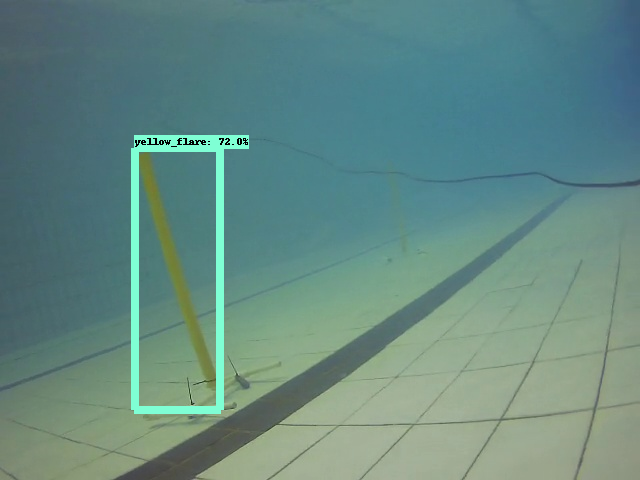

0:00:00.116103
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 1., 1., 2., 2., 1., 1., 1., 3., 4., 4., 3., 1., 4.,
        1., 1., 1., 4., 2., 2., 1., 5., 4., 1., 2., 1., 4., 2., 1., 1.,
        4., 2., 2., 2., 2., 1., 4., 1., 4., 1., 1., 5., 1., 1., 3., 5.,
        1., 2., 4., 5., 4., 2., 2., 2., 2., 1., 2., 4., 5., 5., 4., 1.,
        2., 3., 2., 1., 4., 4., 4., 2., 5., 1., 4., 2., 5., 2., 1., 4.,
        1., 2., 5., 2., 2., 2., 4., 1., 4., 1., 1., 1., 2., 4., 4., 5.,
        2., 4., 4., 3.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[1.94123983e-02, 3.04995120e-01, 7.08571076e-01, 7.72158444e-01],
        [0.00000000e+00, 4.86902773e-01, 8.91531110e-01, 8.06914032e-01],
        [9.14004445e-03, 3.27389717e-01, 7.84282565e-01, 7.75115371e-01],
        [0.00000000e+00, 3.65270376e-01, 8.1201231

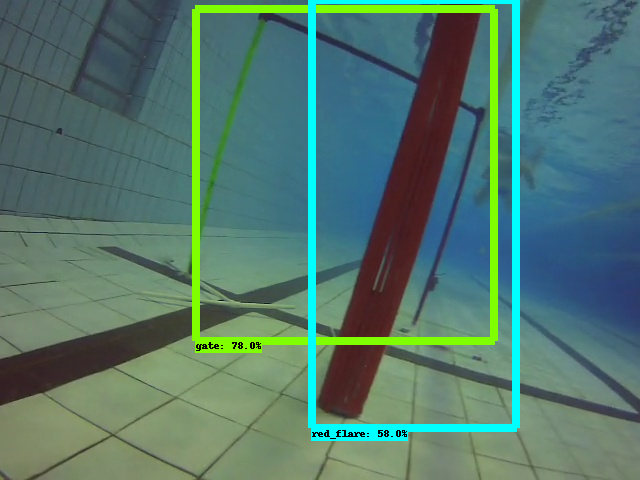

0:00:00.138673
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 2., 2., 1., 4., 2., 1., 2., 4., 1., 2., 1., 1., 3.,
        2., 2., 4., 4., 4., 5., 1., 2., 2., 2., 1., 4., 4., 2., 2., 2.,
        2., 2., 1., 2., 1., 1., 4., 4., 1., 4., 5., 1., 1., 1., 1., 2.,
        4., 1., 2., 1., 5., 5., 2., 1., 1., 2., 5., 4., 4., 2., 4., 2.,
        5., 1., 2., 3., 4., 1., 2., 3., 3., 1., 1., 4., 5., 2., 4., 5.,
        2., 1., 3., 2., 4., 3., 4., 4., 4., 1., 4., 5., 4., 5., 4., 1.,
        2., 1., 4., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[1.18090779e-01, 5.01226783e-02, 9.77396607e-01, 6.59532845e-01],
        [0.00000000e+00, 1.23888016e-01, 1.00000000e+00, 5.31341493e-01],
        [1.18090779e-01, 5.01226783e-02, 9.77396607e-01, 6.59532845e-01],
        [0.00000000e+00, 2.27695674e-01, 1.0000000

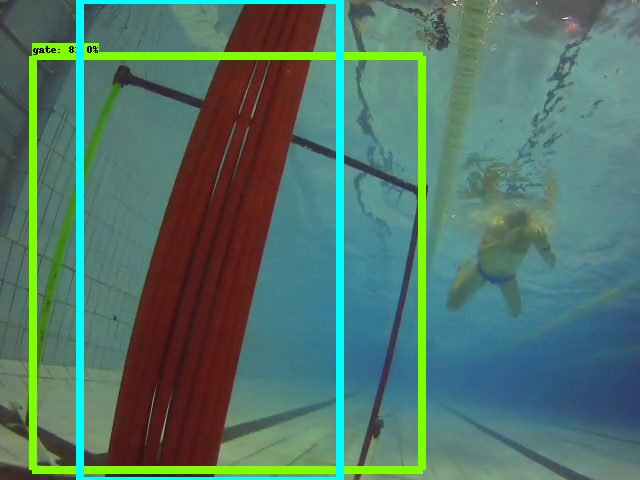

0:00:00.150839
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 1., 1., 2., 3., 4., 3., 3., 1., 2., 1., 4., 5., 3.,
        4., 4., 4., 1., 2., 1., 1., 5., 2., 1., 4., 1., 4., 4., 1., 5.,
        1., 3., 1., 1., 4., 2., 5., 2., 2., 1., 3., 2., 1., 2., 4., 1.,
        2., 4., 4., 2., 4., 4., 2., 1., 4., 4., 1., 2., 5., 1., 2., 1.,
        4., 2., 2., 1., 2., 5., 4., 5., 4., 2., 4., 4., 1., 2., 4., 5.,
        4., 1., 1., 1., 3., 4., 1., 2., 4., 1., 4., 4., 1., 4., 1., 4.,
        5., 4., 1., 3.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[2.5378019e-02, 3.8841811e-01, 5.9831667e-01, 7.1499515e-01],
        [0.0000000e+00, 4.0679055e-01, 6.5728891e-01, 5.9212983e-01],
        [1.1072099e-02, 4.0763822e-01, 6.2974137e-01, 7.0117068e-01],
        [0.0000000e+00, 4.0679055e-01, 6.5728891e-01, 5.921298

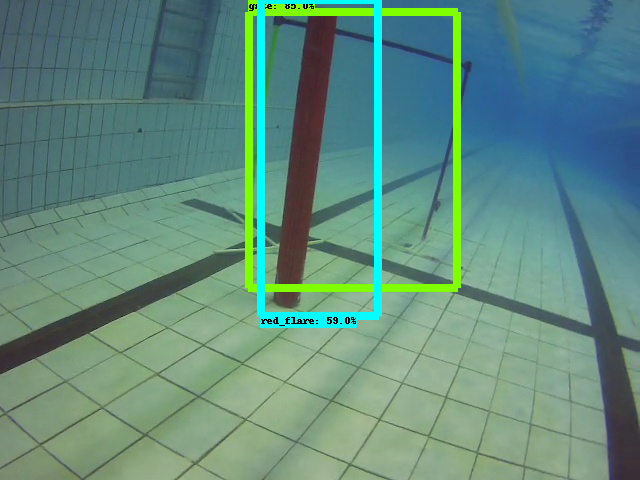

0:00:00.148815
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 4., 4., 4., 4., 4., 1., 4., 4., 4., 4., 3., 4., 5., 1., 1.,
        1., 4., 1., 4., 1., 1., 2., 4., 3., 4., 1., 4., 2., 1., 3., 2.,
        5., 5., 1., 4., 4., 4., 4., 3., 4., 3., 3., 3., 1., 1., 2., 4.,
        5., 5., 5., 4., 5., 4., 1., 4., 2., 1., 4., 4., 4., 2., 2., 3.,
        4., 4., 1., 3., 4., 3., 1., 1., 4., 2., 1., 2., 2., 5., 4., 2.,
        2., 2., 3., 5., 4., 4., 1., 4., 4., 2., 4., 3., 3., 4., 1., 4.,
        4., 4., 2., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[6.7623323e-01, 5.1764417e-01, 9.9756712e-01, 8.5769796e-01],
        [1.6057350e-01, 8.2032847e-01, 5.4224068e-01, 9.8701012e-01],
        [0.0000000e+00, 3.1957194e-01, 8.3087718e-01, 1.0000000e+00],
        [1.4127493e-02, 7.1321219e-01, 7.7854609e-01, 9.980006

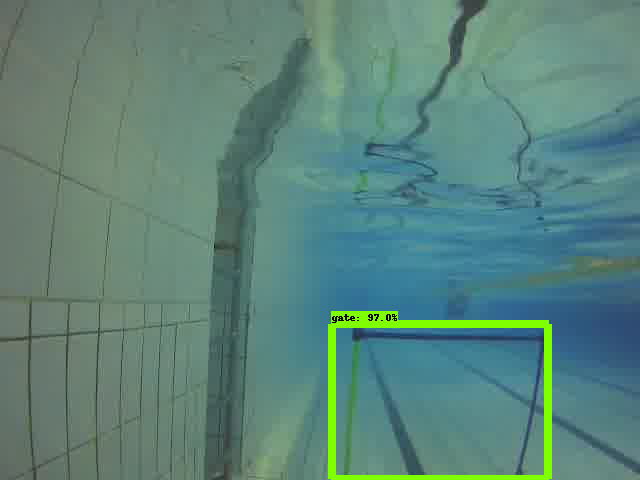

0:00:00.071443
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 3., 4., 4., 2., 1., 5., 1., 4., 1., 3., 3., 2., 1., 1., 4.,
        3., 2., 4., 4., 4., 1., 1., 2., 4., 4., 1., 2., 2., 2., 4., 2.,
        1., 1., 4., 4., 1., 1., 4., 2., 1., 1., 1., 4., 1., 4., 1., 1.,
        1., 3., 1., 4., 1., 4., 3., 1., 2., 4., 1., 2., 1., 1., 1., 1.,
        4., 2., 3., 1., 1., 1., 1., 1., 3., 4., 1., 1., 4., 2., 4., 1.,
        1., 4., 5., 2., 1., 2., 4., 4., 1., 2., 1., 4., 5., 3., 2., 3.,
        1., 5., 2., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[3.81220847e-01, 1.62300110e-01, 9.83259678e-01, 5.59618950e-01],
        [3.79304290e-01, 1.54685453e-01, 1.00000000e+00, 5.62003613e-01],
        [1.14039481e-02, 2.77853936e-01, 5.44237852e-01, 9.14245248e-01],
        [3.87563914e-01, 1.60913408e-01, 9.9435401

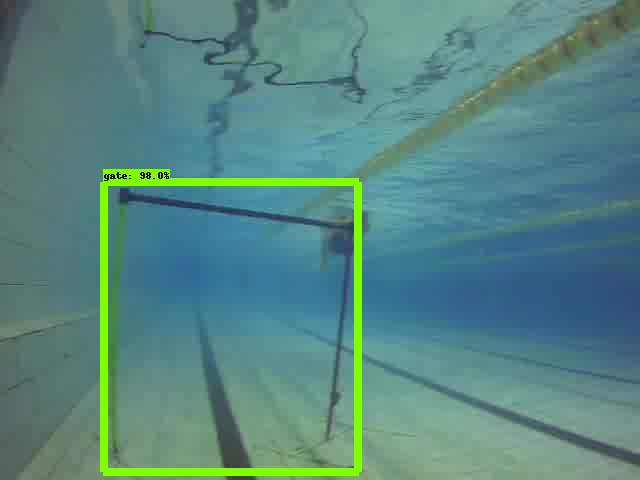

0:00:00.073969
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 1., 1., 3., 4., 1., 1., 2., 2., 4., 1., 1., 4., 3., 1.,
        4., 1., 1., 4., 2., 1., 1., 2., 4., 3., 1., 3., 2., 1., 2., 3.,
        1., 1., 4., 4., 4., 4., 1., 2., 5., 5., 3., 3., 3., 1., 1., 4.,
        5., 2., 4., 5., 2., 3., 3., 4., 3., 5., 2., 4., 1., 2., 4., 3.,
        2., 2., 1., 3., 1., 4., 1., 3., 4., 5., 4., 4., 4., 2., 1., 3.,
        5., 4., 4., 3., 3., 1., 1., 1., 4., 3., 1., 4., 4., 2., 2., 2.,
        2., 4., 4., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.6210195 , 0.34937295, 1.        , 0.39109454],
        [0.97567904, 0.61334366, 1.        , 1.        ],
        [0.96054065, 0.6888057 , 0.9985639 , 1.        ],
        [0.6333581 , 0.31071666, 1.        , 0.3919522 ],
        [0.62033916, 0.34377387, 1.     

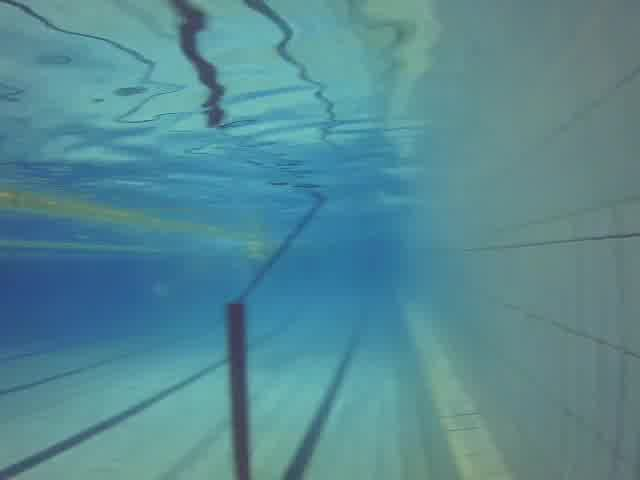

0:00:00.075169
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 1., 3., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 2., 2.,
        3., 1., 1., 4., 1., 1., 1., 2., 1., 1., 2., 3., 2., 1., 2., 1.,
        1., 2., 2., 3., 1., 3., 1., 2., 2., 4., 2., 1., 2., 1., 1., 2.,
        2., 4., 1., 2., 3., 3., 3., 3., 1., 1., 2., 1., 2., 4., 1., 3.,
        5., 2., 1., 5., 4., 2., 1., 1., 4., 3., 2., 3., 3., 1., 3., 3.,
        2., 2., 5., 2., 2., 3., 1., 2., 1., 2., 2., 3., 2., 1., 4., 1.,
        5., 1., 4., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.        , 0.05012492, 0.9908309 , 0.25095123],
        [0.        , 0.05012492, 0.9908309 , 0.25095123],
        [0.03833532, 0.061344  , 0.97184837, 0.9827815 ],
        [0.        , 0.05012492, 0.9908309 , 0.25095123],
        [0.95992935, 0.56726104, 0.99840

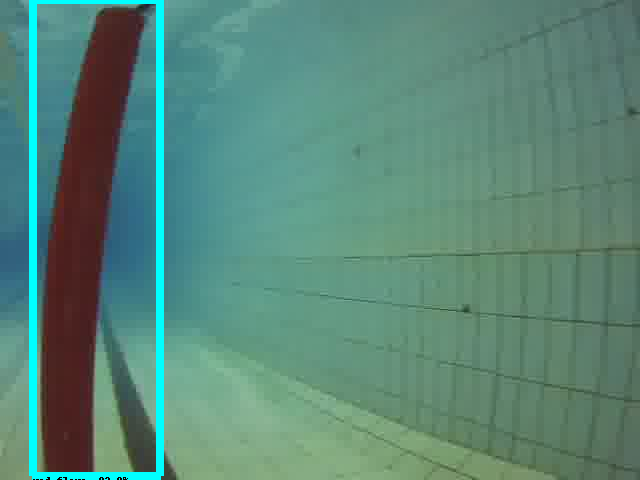

0:00:00.060132
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 1., 2., 1., 3., 1., 2., 2., 3., 1., 1., 1., 2., 5., 4.,
        2., 1., 2., 1., 1., 2., 1., 3., 1., 2., 2., 2., 4., 2., 2., 1.,
        4., 1., 4., 1., 1., 2., 1., 2., 3., 2., 3., 3., 3., 2., 1., 1.,
        1., 5., 5., 2., 1., 1., 3., 2., 2., 2., 3., 1., 4., 2., 2., 3.,
        2., 1., 1., 4., 2., 2., 1., 3., 3., 1., 1., 3., 1., 2., 4., 4.,
        3., 3., 2., 1., 2., 4., 1., 2., 1., 3., 3., 4., 3., 2., 4., 3.,
        4., 4., 1., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[2.1482974e-02, 2.5132471e-01, 6.3137817e-01, 3.8755512e-01],
        [2.0461529e-02, 6.6038370e-03, 5.2071702e-01, 3.4154388e-01],
        [0.0000000e+00, 1.2728278e-01, 5.8845472e-01, 5.0946742e-01],
        [1.4942825e-02, 1.3260221e-01, 5.6214482e-01, 3.756756

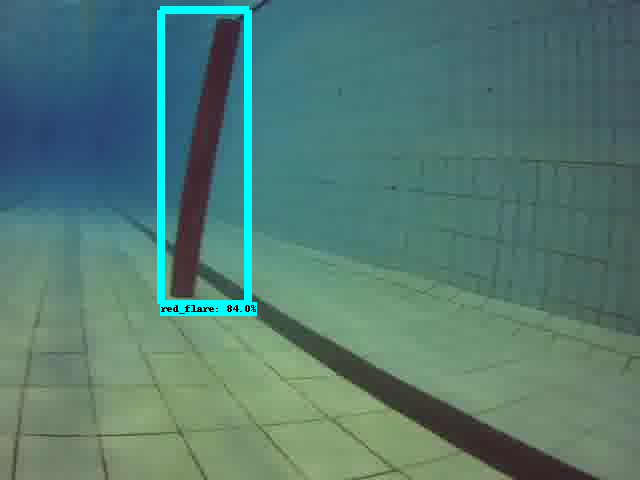

0:00:00.069748
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 1., 1., 3., 1., 1., 1., 2., 1., 5., 2., 2., 1., 1., 1.,
        1., 1., 1., 2., 1., 1., 1., 1., 3., 1., 1., 1., 1., 1., 1., 3.,
        1., 1., 1., 5., 1., 2., 2., 2., 4., 4., 2., 2., 4., 1., 2., 2.,
        5., 3., 2., 1., 1., 1., 1., 4., 2., 2., 2., 4., 2., 1., 2., 4.,
        3., 1., 2., 1., 5., 1., 4., 2., 1., 2., 1., 2., 5., 2., 2., 4.,
        2., 2., 4., 1., 2., 1., 2., 1., 2., 5., 3., 4., 2., 2., 1., 1.,
        2., 1., 2., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.20885834, 0.00904726, 1.        , 0.2516291 ],
        [0.9047173 , 0.31434238, 0.9954766 , 1.        ],
        [0.19341278, 0.00546336, 0.9999604 , 0.262976  ],
        [0.9580579 , 0.4782058 , 0.9967718 , 1.        ],
        [0.19341278, 0.00546336, 0.99996

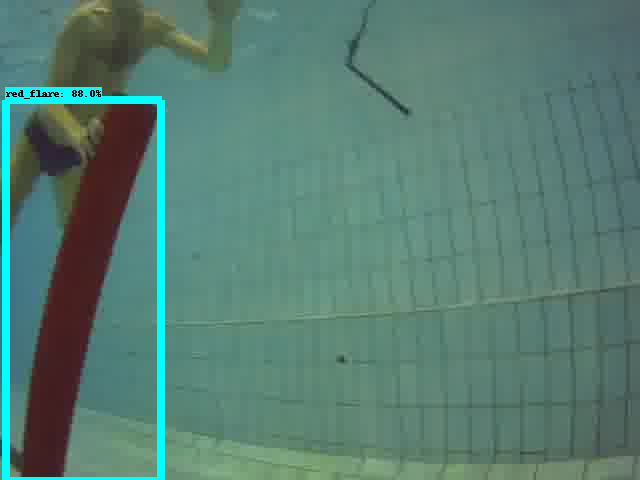

0:00:00.072444
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 1., 2., 3., 4., 2., 2., 1., 5., 2., 2., 2., 1., 1., 2.,
        1., 2., 4., 1., 4., 2., 1., 2., 3., 1., 4., 3., 2., 2., 2., 4.,
        3., 1., 2., 4., 4., 1., 4., 2., 4., 1., 3., 1., 2., 1., 4., 2.,
        2., 4., 3., 4., 2., 3., 1., 2., 4., 1., 4., 1., 2., 1., 1., 2.,
        2., 2., 1., 1., 2., 2., 4., 5., 2., 2., 1., 2., 1., 4., 2., 5.,
        3., 5., 5., 1., 2., 1., 3., 1., 5., 3., 5., 1., 4., 1., 2., 1.,
        4., 3., 5., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.5780662 , 0.53040063, 0.99783474, 0.69712865],
        [0.00152418, 0.12872949, 0.9941014 , 0.97650445],
        [0.01177341, 0.00428216, 0.97665375, 0.2559734 ],
        [0.41085267, 0.46430442, 0.9876876 , 0.672136  ],
        [0.5639186 , 0.53196514, 0.99146

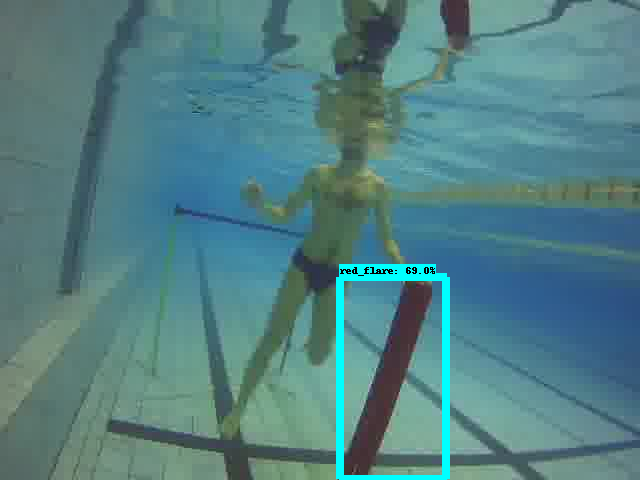

0:00:00.075424
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[4., 4., 4., 4., 4., 3., 1., 4., 3., 1., 4., 3., 1., 5., 5., 5.,
        4., 4., 4., 1., 4., 1., 4., 4., 1., 4., 1., 4., 2., 1., 2., 1.,
        5., 5., 1., 4., 3., 3., 4., 4., 5., 1., 2., 4., 4., 2., 4., 4.,
        4., 4., 4., 1., 4., 4., 1., 4., 4., 2., 4., 1., 4., 4., 3., 4.,
        1., 4., 1., 1., 3., 1., 1., 4., 4., 2., 3., 1., 4., 2., 4., 1.,
        3., 4., 1., 3., 5., 1., 1., 2., 1., 4., 1., 1., 1., 1., 4., 1.,
        1., 4., 1., 3.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.38232   , 0.22421844, 0.97202164, 0.5316022 ],
        [0.15529186, 0.1308457 , 0.9855259 , 0.82501376],
        [0.2427038 , 0.1317737 , 0.9884031 , 0.56211   ],
        [0.41355374, 0.32956907, 0.99854565, 0.538514  ],
        [0.34894857, 0.26558065, 0.98345

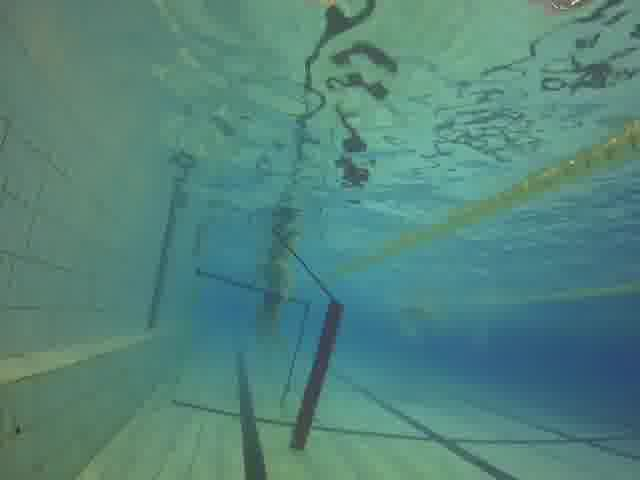

0:00:00.066634
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 1., 1., 3., 2., 3., 1., 1., 5., 4., 4., 1., 5., 2.,
        4., 4., 4., 2., 1., 4., 2., 1., 2., 5., 1., 4., 3., 1., 1., 5.,
        5., 1., 5., 1., 2., 4., 2., 4., 4., 4., 2., 1., 3., 1., 2., 2.,
        4., 1., 1., 2., 5., 1., 4., 1., 1., 4., 2., 2., 1., 2., 2., 4.,
        3., 1., 1., 3., 1., 2., 1., 4., 4., 4., 1., 4., 4., 4., 1., 4.,
        4., 2., 2., 5., 1., 1., 3., 1., 4., 1., 2., 5., 5., 4., 2., 1.,
        2., 1., 1., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.3888686 , 0.24939375, 0.93682003, 0.61896324],
        [0.36812967, 0.41505405, 0.9982036 , 0.608806  ],
        [0.3903289 , 0.2828843 , 0.9739593 , 0.61186785],
        [0.37699366, 0.39429086, 0.98915374, 0.598129  ],
        [0.00649786, 0.00564095, 0.53748

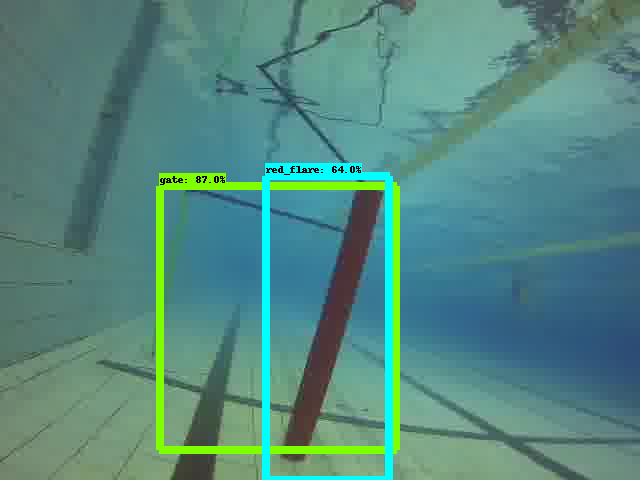

0:00:00.075308
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[2., 1., 2., 1., 1., 2., 1., 1., 3., 2., 1., 4., 2., 3., 5., 2.,
        5., 1., 2., 2., 4., 5., 2., 5., 2., 4., 5., 2., 2., 1., 4., 2.,
        5., 5., 4., 2., 4., 1., 4., 4., 4., 1., 1., 5., 2., 1., 4., 2.,
        4., 4., 4., 1., 4., 2., 4., 3., 1., 4., 2., 5., 1., 4., 2., 2.,
        1., 1., 2., 4., 1., 2., 5., 4., 2., 4., 5., 1., 5., 5., 4., 1.,
        1., 5., 1., 4., 5., 4., 2., 4., 4., 4., 4., 1., 2., 4., 2., 1.,
        3., 5., 5., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.25074595, 0.13620418, 0.97625643, 0.2904405 ],
        [0.13543612, 0.00523446, 0.95295185, 0.24917024],
        [0.28475648, 0.05259421, 0.96325666, 0.27369437],
        [0.3030818 , 0.00682918, 0.929115  , 0.18032819],
        [0.28349805, 0.04863304, 0.97571

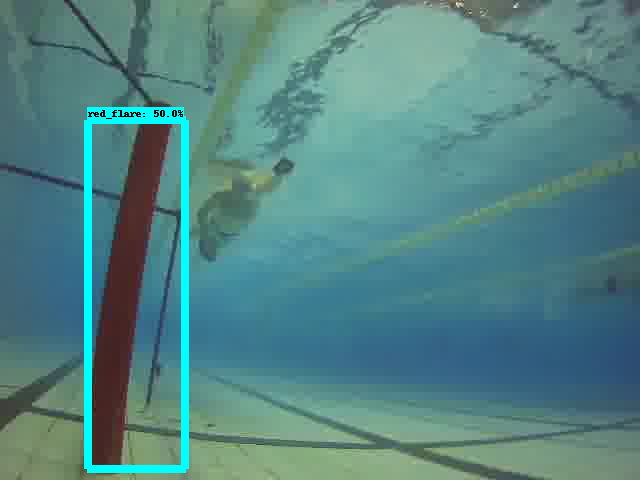

0:00:00.072064
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[4., 2., 1., 1., 1., 3., 4., 4., 2., 4., 3., 1., 4., 2., 4., 4.,
        5., 1., 2., 4., 5., 3., 1., 5., 2., 5., 1., 4., 4., 4., 5., 2.,
        5., 4., 1., 2., 4., 4., 4., 4., 4., 5., 1., 4., 4., 1., 1., 4.,
        2., 4., 3., 4., 4., 4., 5., 1., 4., 1., 1., 2., 4., 1., 4., 1.,
        2., 1., 1., 4., 2., 1., 3., 3., 3., 4., 1., 4., 2., 2., 1., 1.,
        4., 3., 5., 5., 1., 2., 2., 4., 1., 2., 2., 1., 4., 4., 4., 1.,
        5., 2., 2., 2.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.14386564, 0.3112726 , 0.9979972 , 1.        ],
        [0.6221541 , 0.61674863, 1.        , 0.78908366],
        [0.28415155, 0.30742624, 0.98900557, 0.8332752 ],
        [0.11596105, 0.33809766, 1.        , 0.9919914 ],
        [0.57601905, 0.5461251 , 1.     

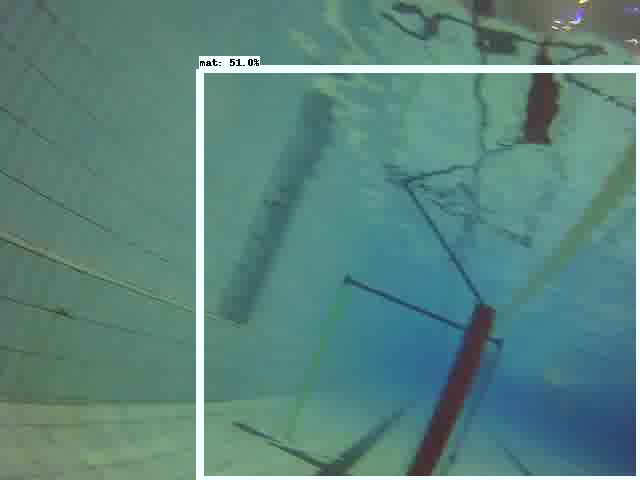

0:00:00.067609
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 2., 2., 4., 4., 4., 5., 4., 5., 4., 4., 4., 4., 5., 4., 4.,
        4., 2., 3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 2.,
        4., 4., 5., 5., 4., 1., 5., 5., 4., 1., 2., 4., 4., 5., 5., 2.,
        1., 5., 4., 1., 4., 4., 4., 4., 4., 4., 4., 4., 5., 4., 1., 4.,
        5., 4., 2., 2., 1., 5., 5., 4., 5., 1., 5., 2., 1., 3., 5., 5.,
        4., 4., 2., 4., 1., 1., 2., 2., 2., 5., 4., 4., 1., 4., 2., 1.,
        1., 1., 4., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.255537  , 0.28797674, 0.99257433, 0.7651086 ],
        [0.25664592, 0.2994777 , 1.        , 0.7539438 ],
        [0.71836084, 0.8527291 , 0.9986226 , 0.9997705 ],
        [0.9922327 , 0.21614988, 0.999609  , 0.6096727 ],
        [0.71836084, 0.8527291 , 0.99862

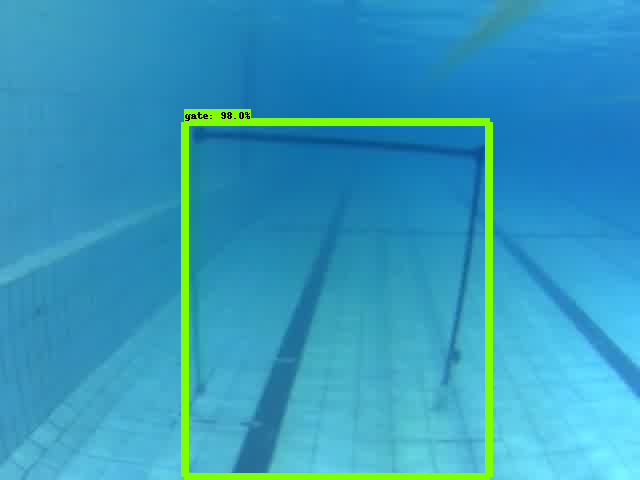

0:00:00.071540
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 4., 1., 4., 4., 4., 5., 2., 2., 1., 4., 4., 3., 2., 3., 4.,
        4., 3., 4., 4., 1., 3., 4., 4., 4., 4., 5., 4., 2., 1., 4., 4.,
        4., 5., 4., 4., 4., 1., 1., 2., 4., 2., 1., 4., 4., 1., 3., 1.,
        1., 1., 5., 4., 2., 1., 1., 5., 2., 1., 4., 1., 1., 4., 1., 1.,
        1., 2., 5., 5., 2., 4., 2., 4., 1., 4., 1., 5., 4., 4., 4., 1.,
        1., 4., 1., 1., 3., 5., 1., 4., 4., 5., 3., 1., 5., 1., 3., 1.,
        1., 4., 4., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.        , 0.        , 0.9715926 , 0.582937  ],
        [0.9637644 , 0.01186888, 0.9946395 , 0.49043763],
        [0.44795352, 0.09799378, 0.96508604, 0.5604745 ],
        [0.9855137 , 0.11202063, 0.99641263, 0.33905312],
        [0.9581368 , 0.09928891, 0.99357

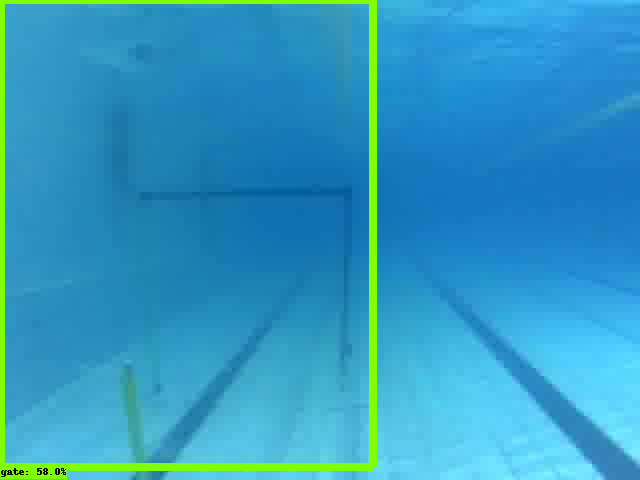

0:00:00.071014
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 4., 4., 5., 4., 4., 2., 4., 4., 4., 4., 5., 4., 1., 5., 5.,
        3., 4., 1., 1., 1., 2., 3., 4., 4., 4., 4., 4., 2., 1., 2., 5.,
        1., 2., 5., 1., 2., 1., 1., 4., 3., 4., 1., 2., 4., 4., 5., 4.,
        5., 1., 1., 5., 2., 4., 4., 1., 5., 4., 1., 1., 5., 4., 1., 4.,
        1., 5., 4., 1., 1., 4., 1., 4., 2., 1., 5., 4., 1., 2., 2., 1.,
        2., 4., 4., 5., 2., 4., 4., 2., 1., 1., 2., 1., 2., 1., 1., 3.,
        1., 2., 1., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[4.44919914e-01, 4.76017982e-01, 9.96106982e-01, 8.69770646e-01],
        [9.87203836e-01, 4.78188515e-01, 9.96492028e-01, 7.35387564e-01],
        [9.82806861e-01, 4.51105565e-01, 9.94164288e-01, 6.58096969e-01],
        [9.83644068e-01, 9.67796504e-01, 1.0000000

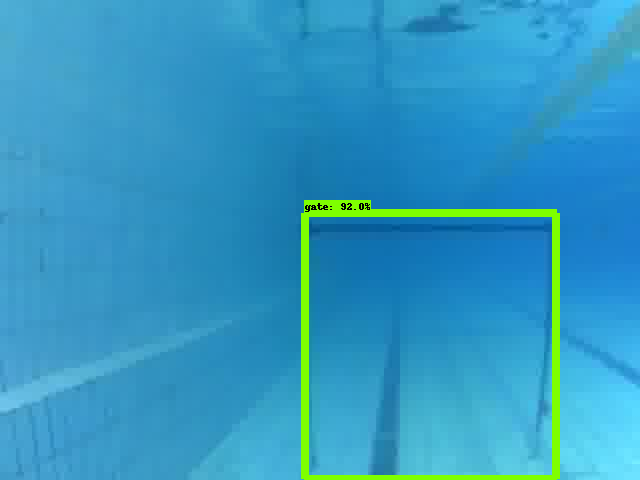

0:00:00.059091
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[1., 5., 4., 5., 4., 4., 1., 4., 4., 1., 4., 4., 2., 4., 2., 2.,
        4., 5., 4., 5., 4., 4., 1., 4., 4., 1., 3., 5., 4., 1., 4., 4.,
        1., 2., 3., 2., 4., 2., 1., 4., 1., 3., 5., 2., 1., 1., 1., 4.,
        4., 2., 1., 4., 1., 1., 1., 1., 2., 2., 4., 3., 2., 1., 5., 3.,
        3., 4., 4., 1., 3., 2., 1., 1., 3., 4., 2., 1., 4., 1., 2., 3.,
        4., 2., 1., 4., 3., 4., 4., 3., 1., 5., 1., 3., 3., 1., 5., 4.,
        1., 4., 5., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[0.18077326, 0.2738486 , 1.        , 1.        ],
        [0.98871374, 0.52015674, 0.99981093, 0.61912525],
        [0.963497  , 0.32748032, 0.99835557, 0.87996984],
        [0.9863088 , 0.5502835 , 0.99735904, 0.6845593 ],
        [0.9683872 , 0.42378893, 1.     

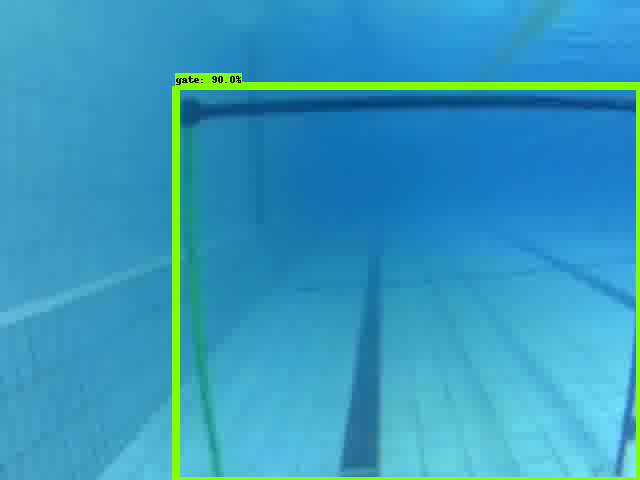

0:00:00.061920
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 5., 4., 1., 1., 2., 2., 4., 4., 1., 1., 4., 4., 2., 4., 5.,
        1., 4., 4., 1., 4., 4., 1., 4., 5., 1., 3., 5., 4., 4., 4., 2.,
        1., 3., 2., 1., 2., 5., 4., 1., 4., 3., 5., 4., 2., 4., 1., 2.,
        5., 4., 4., 2., 4., 5., 4., 5., 2., 2., 4., 1., 4., 3., 5., 3.,
        1., 4., 1., 4., 5., 5., 4., 5., 4., 5., 1., 2., 3., 4., 4., 4.,
        3., 1., 1., 1., 1., 2., 1., 4., 2., 4., 4., 2., 4., 1., 3., 4.,
        1., 4., 3., 4.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[7.73754239e-01, 5.80635369e-01, 9.99253869e-01, 8.07054579e-01],
        [3.80653083e-01, 3.83789062e-01, 5.92479825e-01, 5.29259264e-01],
        [2.69095778e-01, 3.01186532e-01, 9.92764235e-01, 9.96811986e-01],
        [0.00000000e+00, 1.86790600e-02, 9.5678263

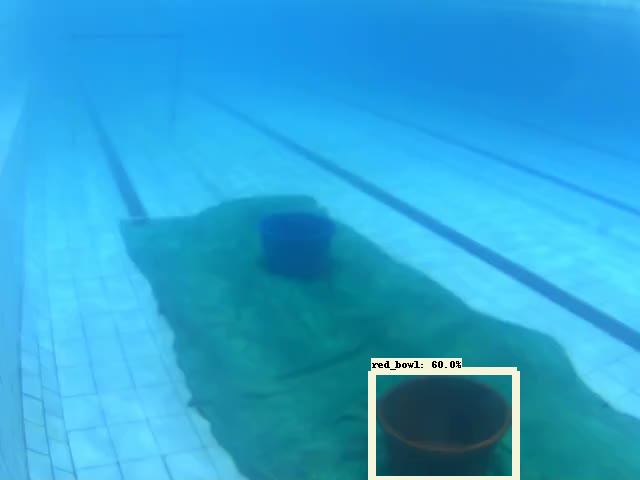

0:00:00.101067
{'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[5., 4., 5., 4., 4., 2., 4., 2., 1., 4., 1., 1., 4., 4., 5., 4.,
        5., 3., 2., 2., 4., 5., 1., 3., 4., 4., 4., 5., 2., 1., 1., 4.,
        4., 3., 1., 1., 2., 4., 3., 4., 1., 2., 1., 3., 4., 2., 5., 2.,
        1., 4., 1., 3., 3., 4., 4., 2., 1., 2., 5., 4., 4., 4., 4., 5.,
        5., 4., 1., 4., 3., 1., 3., 5., 4., 5., 1., 4., 4., 2., 1., 3.,
        4., 4., 4., 1., 1., 1., 3., 1., 5., 4., 1., 3., 3., 5., 4., 4.,
        1., 4., 3., 1.]], dtype=float32)>, 'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>, 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
array([[[5.0465566e-01, 6.0738719e-01, 7.1807438e-01, 7.7584291e-01],
        [4.3964466e-01, 1.2220085e-02, 9.9905503e-01, 9.9636203e-01],
        [9.5881253e-01, 9.5338655e-01, 9.9623615e-01, 9.8969114e-01],
        [3.9174855e-01, 4.8284689e-01, 9.9959195e-01, 1.000000

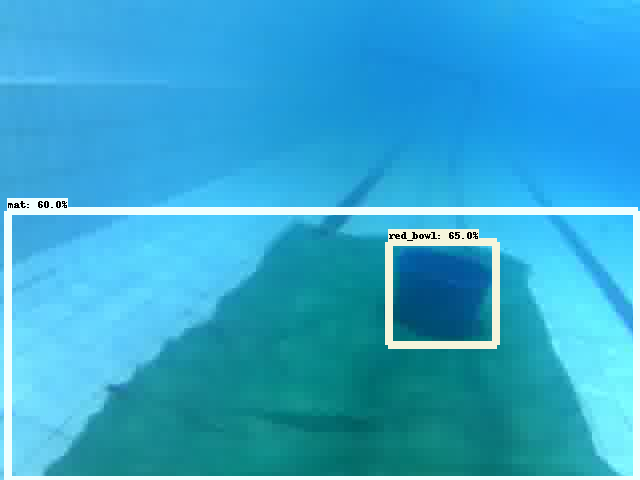

0:00:00.061718


In [18]:
for image_path in TEST_IMAGE_PATHS:
    start_time = datetime.now()
    show_inference(detection_model, image_path)
    print(datetime.now() - start_time)

100
{'detection_classes': array([1, 1, 1, 4, 1, 1, 3, 1, 2, 1, 1, 2, 1, 1, 1, 3, 5, 3, 4, 1, 1, 1,
       3, 2, 4, 3, 2, 2, 2, 5, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 2, 1, 1, 1,
       1, 4, 5, 5, 3, 4, 1, 3, 2, 3, 3, 3, 3, 2, 1, 4, 1, 4, 1, 2, 2, 1,
       3, 1, 1, 2, 1, 3, 1, 2, 1, 1, 2, 3, 1, 3, 4, 3, 3, 2, 4, 1, 1, 1,
       3, 1, 1, 1, 1, 4, 1, 1, 2, 1, 1, 1]), 'detection_boxes': array([[5.08019388e-01, 1.77843541e-01, 9.95638669e-01, 1.00000000e+00],
       [5.43148875e-01, 4.56953317e-01, 9.85790968e-01, 9.85113859e-01],
       [2.26530731e-02, 8.53711367e-02, 1.00000000e+00, 1.00000000e+00],
       [5.43059587e-01, 1.49966717e-01, 9.88935947e-01, 1.00000000e+00],
       [6.35475039e-01, 1.72112212e-02, 9.80662823e-01, 1.86331093e-01],
       [5.00863969e-01, 1.63162485e-01, 9.67261970e-01, 5.75025976e-01],
       [2.68447101e-02, 2.94189155e-03, 9.76543784e-01, 2.26416737e-01],
       [1.46123171e-02, 6.59579970e-03, 5.76410592e-01, 3.56532112e-02],
       [1.14401966e-01, 4.97578681

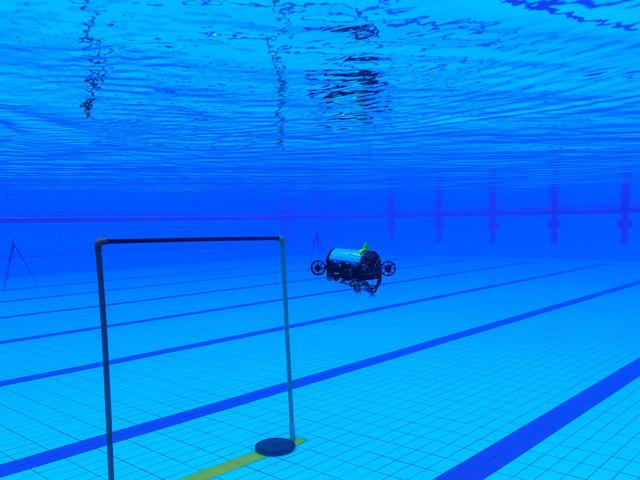

0:00:00.157976


In [27]:
start_time = datetime.now()
show_inference(detection_model, TEST_IMAGE_PATHS[0])
print(datetime.now() - start_time)